# Classification using breast cancer dataset

In [113]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier

In [2]:
df_bcancer=pd.read_csv("d:/csv-ml/breast_cancer.csv")

In [3]:
df_bcancer.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [4]:
#number of missing values

In [5]:
df_bcancer.isna().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [6]:
df_bcancer.dtypes

id                           int64
diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst     

In [7]:
x=df_bcancer.drop(["diagnosis","id"],axis=1)

In [8]:
x.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [9]:
x.columns

Index(['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [10]:
#analysing the features using pair plot

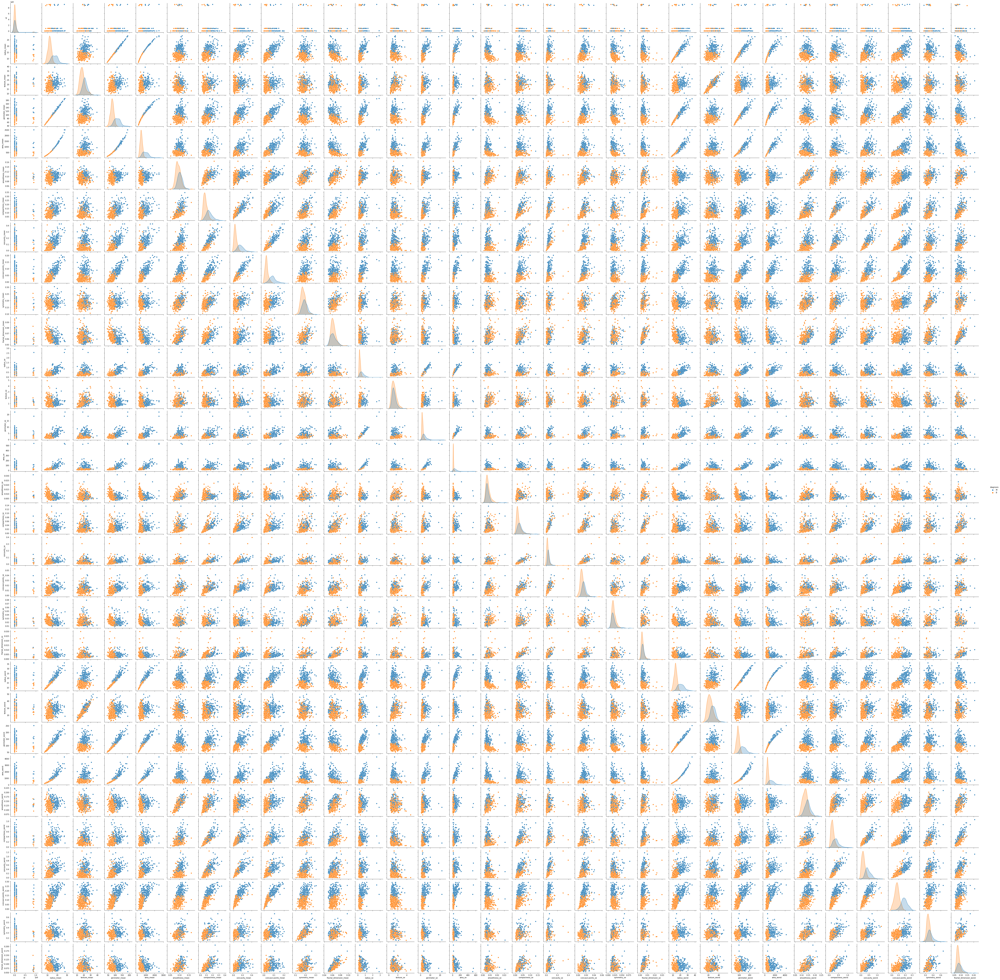

In [11]:
sns.pairplot(df_bcancer,hue="diagnosis")

In [12]:
y=df_bcancer.loc[:,"diagnosis"]

In [13]:
#printing the correlation of the features

In [14]:
df_cor=x.corr()

<AxesSubplot:>

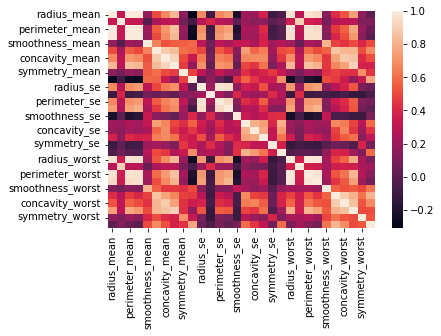

In [15]:
sns.heatmap(df_cor)

In [16]:
#filtering the rows which have high multicolinearity

In [17]:
df_cor[(df_cor>=.6)| (df_cor<-6.0)]

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
radius_mean,1.000000,NaN,0.997855,0.987357,NaN,NaN,0.676764,0.822529,NaN,NaN,...,0.969539,NaN,0.965137,0.941082,NaN,NaN,NaN,0.744214,NaN,NaN
texture_mean,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.912045,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
perimeter_mean,0.997855,NaN,1.000000,0.986507,NaN,NaN,0.716136,0.850977,NaN,NaN,...,0.969476,NaN,0.970387,0.941550,NaN,NaN,NaN,0.771241,NaN,NaN
area_mean,0.987357,NaN,0.986507,1.000000,NaN,NaN,0.685983,0.823269,NaN,NaN,...,0.962746,NaN,0.959120,0.959213,NaN,NaN,NaN,0.722017,NaN,NaN
smoothness_mean,NaN,NaN,NaN,NaN,1.000000,0.659123,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.805324,NaN,NaN,NaN,NaN,NaN
compactness_mean,NaN,NaN,NaN,NaN,0.659123,1.000000,0.883121,0.831135,0.602641,NaN,...,NaN,NaN,NaN,NaN,NaN,0.865809,0.816275,0.815573,NaN,0.687382
concavity_mean,0.676764,NaN,0.716136,0.685983,NaN,0.883121,1.000000,0.921391,NaN,NaN,...,0.688236,NaN,0.729565,0.675987,NaN,0.754968,0.884103,0.861323,NaN,NaN
concave points_mean,0.822529,NaN,0.850977,0.823269,NaN,0.831135,0.921391,1.000000,NaN,NaN,...,0.830318,NaN,0.855923,0.809630,NaN,0.667454,0.752399,0.910155,NaN,NaN
symmetry_mean,NaN,NaN,NaN,NaN,NaN,0.602641,NaN,NaN,1.000000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.699826,NaN
fractal_dimension_mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.767297


In [18]:
#calculate multicollinearity using VIF

In [19]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [20]:
df_vif=pd.DataFrame()

In [21]:
df_vif["features"]=x.columns

In [22]:
df_vif["vif"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]

In [23]:
df_vif

,features,vif
0,radius_mean,63306.172036
1,texture_mean,251.047108
2,perimeter_mean,58123.586079
3,area_mean,1287.262339
4,smoothness_mean,393.398166
5,compactness_mean,200.980354
6,concavity_mean,157.855046
7,concave points_mean,154.241268
8,symmetry_mean,184.426558
9,fractal_dimension_mean,629.679874


In [24]:
df_vif=df_vif.sort_values(["vif"],ascending=False)

In [25]:
df_vif

,features,vif
0,radius_mean,63306.172036
2,perimeter_mean,58123.586079
20,radius_worst,9674.742602
22,perimeter_worst,4487.781270
3,area_mean,1287.262339
23,area_worst,1138.759252
9,fractal_dimension_mean,629.679874
29,fractal_dimension_worst,423.396723
4,smoothness_mean,393.398166
24,smoothness_worst,375.597155


# many of the features have high multicollinearity indicate redundancy and may lead to overfitting,so we are elliminating certain features

# Feature selection

In [26]:
#selecting 2 best features by chi square

In [27]:
from sklearn.feature_selection import SelectKBest, chi2

In [28]:
fs_model=SelectKBest(chi2,k=2).fit(x,y)

In [29]:
cols=fs_model.get_support(indices=True)

In [30]:
cols

array([ 3, 23], dtype=int64)

In [31]:
x.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [32]:
x_new=x.iloc[:,cols]

# The two best features selected

In [33]:
x_new.head()

,area_mean,area_worst
0,1001.0,2019.0
1,1326.0,1956.0
2,1203.0,1709.0
3,386.1,567.7
4,1297.0,1575.0


# Create KNN model

In [34]:
from sklearn.neighbors import KNeighborsClassifier

In [35]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

In [36]:
x_tr,x_test,y_tr,y_test=train_test_split(x_new,y,test_size=.2,random_state=100)

In [37]:
#finding the best value of k

In [38]:
params={"n_neighbors":range(1,51)}

In [39]:
gv_mod=GridSearchCV(KNeighborsClassifier(),params).fit(x_tr,y_tr)

In [40]:
x_tr.shape

(455, 2)

In [41]:
gv_mod.best_params_

{'n_neighbors': 5}

In [42]:
kmodel1=KNeighborsClassifier(n_neighbors=gv_mod.best_params_["n_neighbors"]).fit(x_tr,y_tr)

In [43]:
p1=kmodel1.predict(x_test)

In [44]:
from sklearn.metrics import accuracy_score

In [45]:
accuracy_score(y_test,p1)

0.9473684210526315

# Accuracy score using feature selection(chi2) and KNN is 96%

In [46]:
df_bcancer.shape

(569, 32)

In [47]:
x.shape

(569, 30)

In [48]:
# select features using ANOVA

In [49]:
from sklearn.feature_selection import SelectKBest,f_classif

In [50]:
fs_mod2=SelectKBest(f_classif,k=2).fit(x,y)

In [51]:
cols=fs_mod2.get_support(indices=True)

In [52]:
cols

array([22, 27], dtype=int64)

In [53]:
x_new2=x.iloc[:,cols]

In [54]:
# create KNN model

In [55]:
x_tr,x_test,y_tr,y_test=train_test_split(x_new2,y,test_size=.2,random_state=100)

In [56]:
gs_mod2=GridSearchCV(KNeighborsClassifier(),params).fit(x_tr,y_tr)

In [57]:
gs_mod2.best_params_

{'n_neighbors': 22}

In [58]:
knn_mod2=KNeighborsClassifier(gs_mod2.best_params_["n_neighbors"]).fit(x_tr,y_tr)

In [59]:
p2=knn_mod2.predict(x_test)

In [60]:
accuracy_score(y_test,p2)

0.9385964912280702

# Accuracy score using feature selection(ANOVA) and KNN is 93%

# PCA diensional reduction technique

In [61]:
from sklearn.decomposition import PCA

In [62]:
# scaling or normalisation

In [63]:
from sklearn.preprocessing import MinMaxScaler #x-min(x)/(max(x)-min(x))

In [64]:
scaled_x=MinMaxScaler().fit_transform(x)

In [65]:
scaled_x

array([[0.52103744, 0.0226581 , 0.54598853, ..., 0.91202749, 0.59846245,
        0.41886396],
       [0.64314449, 0.27257355, 0.61578329, ..., 0.63917526, 0.23358959,
        0.22287813],
       [0.60149557, 0.3902604 , 0.59574321, ..., 0.83505155, 0.40370589,
        0.21343303],
       ...,
       [0.45525108, 0.62123774, 0.44578813, ..., 0.48728522, 0.12872068,
        0.1519087 ],
       [0.64456434, 0.66351031, 0.66553797, ..., 0.91065292, 0.49714173,
        0.45231536],
       [0.03686876, 0.50152181, 0.02853984, ..., 0.        , 0.25744136,
        0.10068215]])

In [66]:
pca_x=PCA(n_components=.95).fit_transform(scaled_x,y)

In [67]:
pca_x.shape

(569, 10)

In [68]:
pca_mod=PCA(n_components=.95).fit(scaled_x,y)

In [69]:
pca_mod.explained_variance_

array([0.33133389, 0.10785038, 0.0443947 , 0.04000678, 0.02549742,
       0.01916637, 0.00986455, 0.00743488, 0.00616788, 0.00589966])

In [70]:
pca_list=pca_mod.explained_variance_

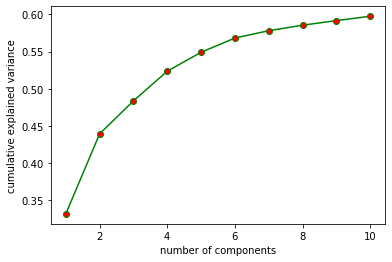

In [71]:
import matplotlib.pyplot as plt
plt.xlabel("number of components")
plt.ylabel("cumulative explained variance")
plt.plot(range(1,len(pca_list)+1),np.cumsum(pca_list),c="green",marker="o",markerfacecolor="red")

In [72]:
pca_x=pca_mod.fit_transform(scaled_x)

In [154]:
x_tr,x_test,y_tr,y_test=train_test_split(pca_x,y,test_size=.2,random_state=100)

In [155]:
# best value of k

In [156]:
gs_mod2=GridSearchCV(KNeighborsClassifier(),params).fit(x_tr,y_tr)

In [157]:
gs_mod2.best_params_

{'n_neighbors': 7}

In [158]:
gs_mod2.best_params_["n_neighbors"]

7

In [159]:
k_mod3=KNeighborsClassifier(gs_mod2.best_params_["n_neighbors"]).fit(x_tr,y_tr)

In [164]:
p_knn_pca_tr=k_mod3.predict(x_tr)

In [166]:
metrics.recall_score(y_tr,p_knn_pca_tr,average="weighted")

0.9802197802197802

In [160]:
p3=k_mod3.predict(x_test)

In [161]:
accuracy_score(y_test,p3)

0.9649122807017544

In [81]:
from sklearn.metrics import confusion_matrix

In [82]:
confusion_matrix(y_test,p3)

array([[65,  0],
       [ 4, 45]], dtype=int64)

In [84]:
metrics.recall_score(y_test,p3,average="weighted")

0.9649122807017544

# PCA is giving the highest accuracy using KNN algorithm 96%

# Decision tree model

In [93]:
x_tr,x_test,y_tr,y_test=train_test_split(x,y,test_size=.2,random_state=100)

In [94]:
dtree=DecisionTreeClassifier(criterion="gini").fit(x_tr,y_tr)

In [95]:
p_tr_dtree=dtree.predict(x_tr)

In [96]:
metrics.confusion_matrix(y_tr,p_tr_dtree)

array([[292,   0],
       [  0, 163]], dtype=int64)

In [97]:
metrics.accuracy_score(y_tr,p_tr_dtree)

1.0

In [98]:
metrics.recall_score(y_tr,p_tr_dtree,average="weighted")

1.0

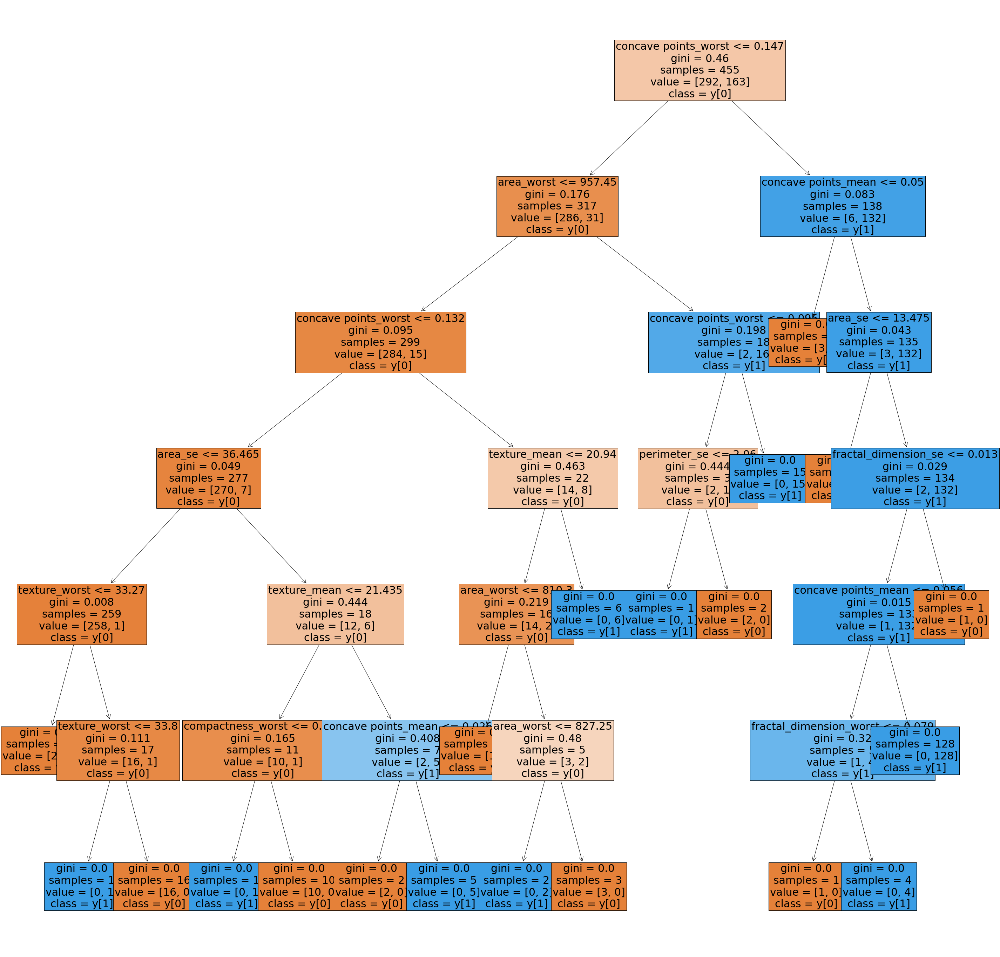

In [111]:
plt.figure(figsize=(50,50))
tree.plot_tree(dtree,filled=True,feature_names = x_tr.columns,class_names=True,fontsize=30)
plt.show()

In [99]:
p_test_dtree=dtree.predict(x_test)

In [100]:
metrics.recall_score(y_test,p_test_dtree,average="weighted")

0.956140350877193

# Random forest model

In [92]:
x_tr,x_test,y_tr,y_test=train_test_split(x,y,test_size=.2,random_state=100)

In [114]:
rf_dtree=RandomForestClassifier(n_estimators=500).fit(x_tr,y_tr)

In [115]:
p_rf_tr=rf_dtree.predict(x_tr)

In [119]:
metrics.recall_score(y_tr,p_rf_tr,average="weighted")

1.0

In [121]:
metrics.accuracy_score(y_tr,p_rf_tr)

1.0

In [122]:
p_rf_test=rf_dtree.predict(x_test)

In [123]:
metrics.recall_score(y_test,p_rf_test,average="weighted")

0.9649122807017544

In [132]:
#The random forest model though shows higher performance shows overfitting (96.4%)

# Random forest model with PCA

In [125]:
x_tr,x_test,y_tr,y_test=train_test_split(pca_x,y,test_size=.2,random_state=100)

In [126]:
rf_pca=RandomForestClassifier(n_estimators=500).fit(x_tr,y_tr)

In [127]:
pca_rf_tr=rf_pca.predict(x_tr)

In [128]:
metrics.recall_score(y_tr,pca_rf_tr,average="weighted")

1.0

In [129]:
metrics.accuracy_score(y_tr,pca_rf_tr)

1.0

In [130]:
pca_rf_test=rf_pca.predict(x_test)

In [131]:
metrics.recall_score(y_test,pca_rf_test,average="weighted")

0.9736842105263158

In [133]:
#The random forest model though shows higher performance shows overfitting (97.3%)

# XGBoost Classifier model

In [134]:
import xgboost as xgb

In [141]:
y.value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

In [142]:
y_new=y.map({"B":0,"M":1})

In [143]:
y_new.value_counts()

0    357
1    212
Name: diagnosis, dtype: int64

- **learning_rate: step size shrinkage used to prevent overfitting. Range is [0,1]**
- **max_depth: determines how deeply each tree is allowed to grow during any boosting round.**
- **colsample_bytree: percentage of features used per tree. High value can lead to overfitting.**
- **n_estimators: number of trees you want to build.**
- **objective: determines the loss function to be used like reg:linear for regression problems, reg:logistic for classification problems with only decision, binary:logistic for classification problems with probability.**

In [144]:
xgb_mod=xgb.XGBClassifier(objective="reg:logistic",learning_rate=.1,n_estimators=100,max_depth=5,colsample_bytree=.3)

In [145]:
x_tr,x_test,y_tr,y_test=train_test_split(x,y_new,test_size=.2,random_state=100)

In [146]:
xgb_mod.fit(x_tr,y_tr)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.3,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='reg:logistic',
              predictor='auto', random_state=0, reg_alpha=0, ...)

In [147]:
p_xgb_tr=xgb_mod.predict(x_tr)

In [148]:
metrics.recall_score(y_tr,p_xgb_tr)

1.0

In [149]:
metrics.accuracy_score(y_tr,p_xgb_tr)

1.0

In [151]:
p_xgb_test=xgb_mod.predict(x_test)

In [152]:
metrics.recall_score(y_test,p_xgb_test)

0.9183673469387755

In [153]:
metrics.accuracy_score(y_test,p_xgb_test)

0.956140350877193

# Conclusion

# After analysing all models, I recommend implementing KNN with PCA as it shows high performance without overfitting